# Semantic Segmentation with Deep Learning

In [ ]:
import torch
device = torch.device('cpu')
use_cuda = False
if torch.cuda.is_available():
    if use_cuda or use_colab:
        device = torch.device('cuda')
        print("CUDA-compatible NVIDIA GPU enabled.")
    else:
        print("CUDA-compatible NVIDIA GPU detected. Consider setting use_cuda to True.")
if device.type == 'cpu':
        print("Warning: the configured accelerator is set to CPU-only. This will work, but will be very slow. Consider using Colab, or if a GPU was detected above, consider enabling it.")

print("Using device: %s" % str(device))

Using device: cpu


Download ImageNet-pretrained ResNet-50. The following two cells will automatically do this locally on Mac and Linux. If you are working locally on Windows, download the file directly from [here](https://docs.google.com/uc?export=download&id=1w5pRmLJXvmQQA5PtCbHhZc_uC4o0YbmA). Place it in a folder named `initmodel`.

In [ ]:
# If you're using MacOS, uncomment the following line:
!mamba install conda-forge::wget -y
!wget -O "resnet50_v2.pth" --no-check-certificate 'https://static.kirijo.group/resnet50_v2.pth'
!mkdir initmodel && mv resnet50_v2.pth initmodel/

In [ ]:
# The ImageNet-pretrained ResNet-50 weights should be 99 MB
!ls -ltrh initmodel

Download the Camvid dataset images. The following two cells will automatically do this locally on Mac and Linux. If you are working locally on Windows, download the file directly from [here](https://github.com/johnwlambert/camvid-dataset-mirror/releases/download/v1.0.0/701_StillsRaw_full.zip) and place the contents under the `Camvid` directory. You should then have a folder called `701_StillsRaw_full` under `Camvid`.

In [ ]:
!chmod +rwx download_dataset.sh
!sed -i -e 's/\r$//' download_dataset.sh
!./download_dataset.sh Camvid

In [ ]:
!ls
!cd Camvid && unzip camvid_semseg11.zip && cd ..

We'll now set some default hyperparameters for training. Choose the number of epochs you'd like to train for (for PSPNet, it will take ~30 min for 50 epochs, or ~70 min for 100 epochs).

In [3]:
!python --version
from types import SimpleNamespace

args = SimpleNamespace(
    **{
        # DEVICE
        "device": device,
        # DATA
        "names_path": "./dataset_lists/camvid-11/camvid-11_names.txt",
        "data_root": "./Camvid/",
        "train_list": "./src/dataset_lists/camvid-11/list/train.txt",  
        "val_list": "./src/dataset_lists/camvid-11/list/val.txt",
        "classes": 11,
        # TRAIN
        "arch": "PSPNet", # "SimpleSegmentationNet", 
        "save_path": "",
        "epochs": 30,
        "zoom_factor": 8,
        "use_ppm": True,
        "aux_weight": 0.4,
        "aux_loss": True,
        "layers": 50,
        "workers": 2,
        "batch_size": 32,
        "batch_size_val": 32,
        "data_aug": True,
        "short_size": 240,
        "train_h": 201,
        "train_w": 201,
        "init_weight": "./initmodel/resnet50_v2.pth",
        "scale_min": 0.5,  # minimum random scale
        "scale_max": 2.0,  # maximum random scale
        "rotate_min": -10,  # minimum random rotate
        "rotate_max": 10,  # maximum random rotate
        "ignore_label": 255,
        "base_lr": 0.003,
        "start_epoch": 0,
        "power": 0.9,
        "momentum": 0.9,
        "weight_decay": 0.0001,
        "manual_seed": 0,
        "print_freq": 10,
        "save_freq": 1,
        "evaluate": True,  # evaluate on validation set, extra gpu memory needed and small batch_size_val is recommend
        "multiprocessing_distributed": False,
        # INFERENCE
        "dataset": "camvid-11",
        "base_size": 240,
        "test_h": 201,
        "test_w": 201,
        "scales": [1.0], # [0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        "test_list": "./src/dataset_lists/camvid-11/list/val.txt",
        "vis_freq": 10,
        "pretrained": True
    }
)

args.save_path = f"exp/camvid/{args.arch}/model"

Python 3.12.8


In [4]:
import os

import torch

os.makedirs(args.save_path, exist_ok=True)
from vision.trainer import main_worker
print(args)
main_worker(args, device)

namespace(device=device(type='cpu'), names_path='./dataset_lists/camvid-11/camvid-11_names.txt', data_root='./Camvid/', train_list='./src/dataset_lists/camvid-11/list/train.txt', val_list='./src/dataset_lists/camvid-11/list/val.txt', classes=11, arch='PSPNet', save_path='exp/camvid/PSPNet/model', epochs=30, zoom_factor=8, use_ppm=True, aux_weight=0.4, aux_loss=True, layers=50, workers=2, batch_size=32, batch_size_val=32, data_aug=True, short_size=240, train_h=201, train_w=201, init_weight='./initmodel/resnet50_v2.pth', scale_min=0.5, scale_max=2.0, rotate_min=-10, rotate_max=10, ignore_label=255, base_lr=0.003, start_epoch=0, power=0.9, momentum=0.9, weight_decay=0.0001, manual_seed=0, print_freq=10, save_freq=1, evaluate=True, multiprocessing_distributed=False, dataset='camvid-11', base_size=240, test_h=201, test_w=201, scales=[1.0], test_list='./src/dataset_lists/camvid-11/list/val.txt', vis_freq=10, pretrained=True)


/Users/poorvaja/Documents/GT/CV/project-4-student/src/vision/resnet.py:205: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path), stric

[2025-10-29 09:43:24,648 INFO trainer.py line 59 20072] namespace(device=device(type='cpu'), names_path='./dataset_lists/camvid-11/camvid-11_names.txt', data_root='./Camvid/', train_list='./src/dataset_lists/camvid-11/list/train.txt', val_list='./src/dataset_lists/camvid-11/list/val.txt', classes=11, arch='PSPNet', save_path='exp/camvid/PSPNet/model', epochs=30, zoom_factor=8, use_ppm=True, aux_weight=0.4, aux_loss=True, layers=50, workers=2, batch_size=32, batch_size_val=32, data_aug=True, short_size=240, train_h=201, train_w=201, init_weight='./initmodel/resnet50_v2.pth', scale_min=0.5, scale_max=2.0, rotate_min=-10, rotate_max=10, ignore_label=255, base_lr=0.003, start_epoch=0, power=0.9, momentum=0.9, weight_decay=0.0001, manual_seed=0, print_freq=10, save_freq=1, evaluate=True, multiprocessing_distributed=False, dataset='camvid-11', base_size=240, test_h=201, test_w=201, scales=[1.0], test_list='./src/dataset_lists/camvid-11/list/val.txt', vis_freq=10, pretrained=True)
[2025-10-29

In [ ]:
# Debug: Let's examine class distribution and accuracy issues
import numpy as np

# Load class names to understand which classes might be problematic
class_names = []
with open(args.names_path, 'r') as f:
    class_names = [line.strip() for line in f.readlines()]

print("Class names in CamVid dataset:")
for i, name in enumerate(class_names):
    print(f"Class {i}: {name}")

# Check if there are any dataset statistics we can examine
print(f"\nDataset configuration:")
print(f"Number of classes: {args.classes}")
print(f"Train list path: {args.train_list}")
print(f"Val list path: {args.val_list}")
print(f"Ignore label: {args.ignore_label}")

# Let's also look at a sample from the validation set to understand the data
print("\nFirst few lines from validation list:")
with open(args.val_list, 'r') as f:
    val_lines = f.readlines()[:3]
    for line in val_lines:
        print(line.strip())

## Understanding Zero Accuracies

The zero accuracies you're seeing are common in semantic segmentation, especially for:

1. **Rare classes** like `Bicyclist` or `Pedestrian` - these appear in very few pixels
2. **Small objects** that are hard to detect at low resolution 
3. **Early training stages** - 5 epochs may not be enough for rare classes

### Potential Solutions:
- **Increase training epochs** (try 20-50 epochs)
- **Use class weighting** in the loss function to balance rare classes
- **Increase batch size** if possible to see more class diversity per batch
- **Use data augmentation** to create more examples of rare classes

### Expected Behavior:
- Common classes like `Sky`, `Road`, `Building` should have higher accuracy
- Rare classes like `Bicyclist`, `SignSymbol` may start at 0% and improve slowly

We'll now create full-resolution predictions for the full val set, and compute mIoU against the ground truth.

In [5]:
from vision.test import test_model
args.model_path = f"exp/camvid/{args.arch}/model/train_epoch_{args.epochs}.pth"
test_model(args)

[2025-10-29 19:32:14,920 INFO test.py line 279 20072] => loading checkpoint 'exp/camvid/PSPNet/model/train_epoch_30.pth'
[2025-10-29 19:32:15,084 INFO test.py line 282 20072] => loaded checkpoint 'exp/camvid/PSPNet/model/train_epoch_30.pth'
[2025-10-29 19:32:15,091 INFO test.py line 294 20072] >>>>>>>>>>>>>> Start inference task >>>>>>>>>>>>>
List of (image,label) pairs test list generated!
[2025-10-29 19:32:15,084 INFO test.py line 282 20072] => loaded checkpoint 'exp/camvid/PSPNet/model/train_epoch_30.pth'
[2025-10-29 19:32:15,091 INFO test.py line 294 20072] >>>>>>>>>>>>>> Start inference task >>>>>>>>>>>>>
List of (image,label) pairs test list generated!


/Users/poorvaja/Documents/GT/CV/project-4-student/src/vision/test.py:280: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(args.model_path, map_location

[2025-10-29 19:32:16,549 INFO test.py line 399 20072] On image 0
[2025-10-29 19:32:16,551 INFO test.py line 399 20072] On image 1
[2025-10-29 19:32:16,551 INFO test.py line 399 20072] On image 1
[2025-10-29 19:32:16,570 INFO test.py line 399 20072] On image 2
[2025-10-29 19:32:16,571 INFO test.py line 399 20072] On image 3
[2025-10-29 19:32:16,570 INFO test.py line 399 20072] On image 2
[2025-10-29 19:32:16,571 INFO test.py line 399 20072] On image 3
[2025-10-29 19:32:16,590 INFO test.py line 399 20072] On image 4
[2025-10-29 19:32:16,591 INFO test.py line 399 20072] On image 5
[2025-10-29 19:32:16,590 INFO test.py line 399 20072] On image 4
[2025-10-29 19:32:16,591 INFO test.py line 399 20072] On image 5
[2025-10-29 19:32:16,609 INFO test.py line 399 20072] On image 6
[2025-10-29 19:32:16,610 INFO test.py line 399 20072] On image 7
[2025-10-29 19:32:16,609 INFO test.py line 399 20072] On image 6
[2025-10-29 19:32:16,610 INFO test.py line 399 20072] On image 7
[2025-10-29 19:32:16,628 

**Important**: Record the mIoU listed in the output above, and the IoU per each class. You can find the results later in `train_epoch_{args.epochs}/camvid-11/720/results.txt`.

Now, let's take a look at what our results look like. We'll make a 2x3 image grid with the following structure:

|RGB Image | Blended RGB and Ground Truth | Ground Truth 
|:-: | :-: | :-:
| RGB Image | Blended RGB and Prediction | Prediction

/var/folders/bm/pb_4yn1s3vjbt8krr96bg2840000gn/T/ipykernel_20072/2526920291.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_grid = imageio.imread(f'{rgb_predictions_dir}/{img_fname}')


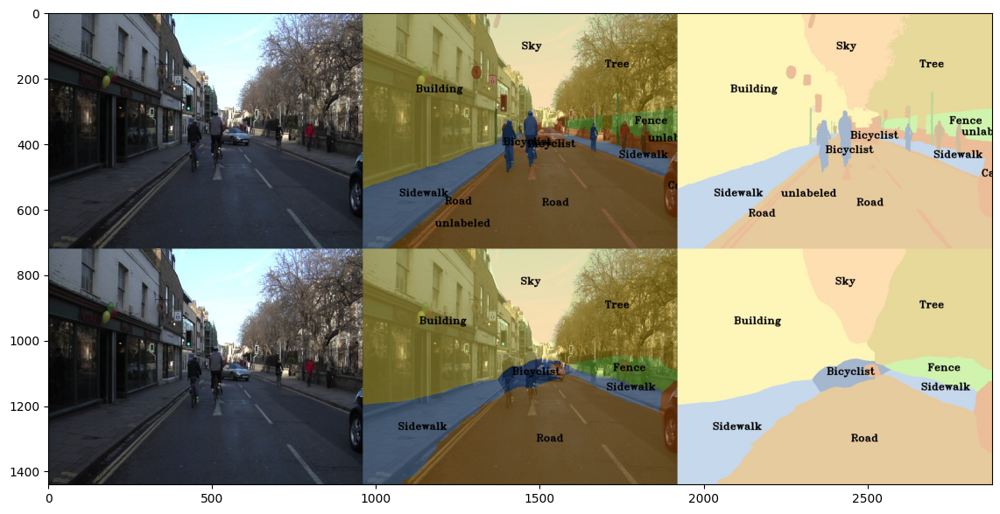

In [6]:
import imageio
import matplotlib.pyplot as plt

rgb_predictions_dir = f"train_epoch_{args.epochs}/camvid-11/{args.base_size}/rgb_mask_predictions"

def show_image_grid(rgb_predictions_dir: str, img_fname: str) -> None:
  img_grid = imageio.imread(f'{rgb_predictions_dir}/{img_fname}')
  plt.figure(figsize=(15,7))
  plt.imshow(img_grid)
  plt.show()

show_image_grid(rgb_predictions_dir, "0016E5_07977.jpg")

We'll look at more examples:

/var/folders/bm/pb_4yn1s3vjbt8krr96bg2840000gn/T/ipykernel_20072/2526920291.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_grid = imageio.imread(f'{rgb_predictions_dir}/{img_fname}')


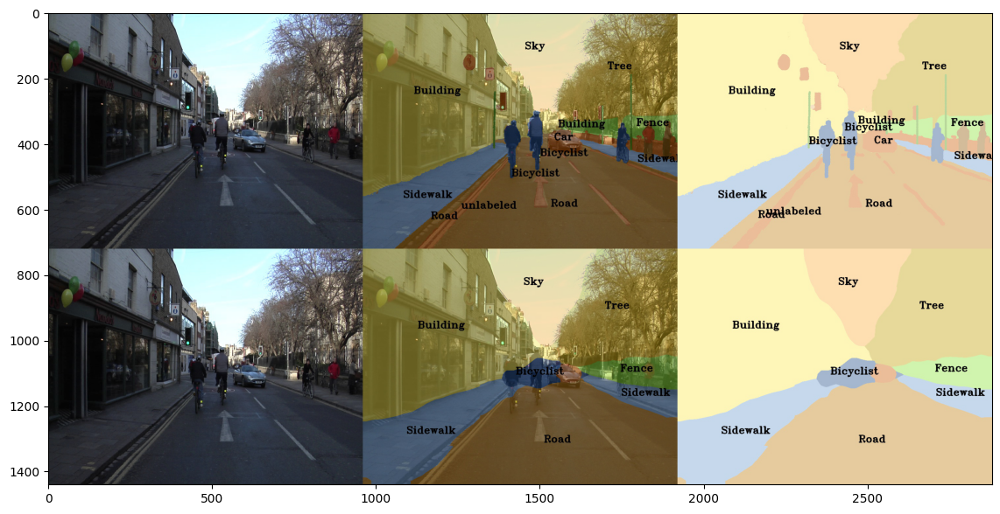

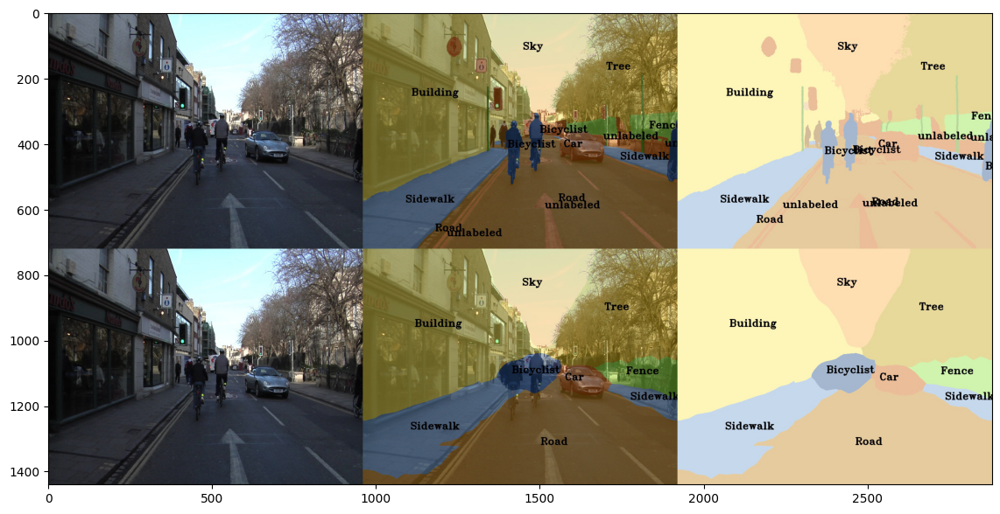

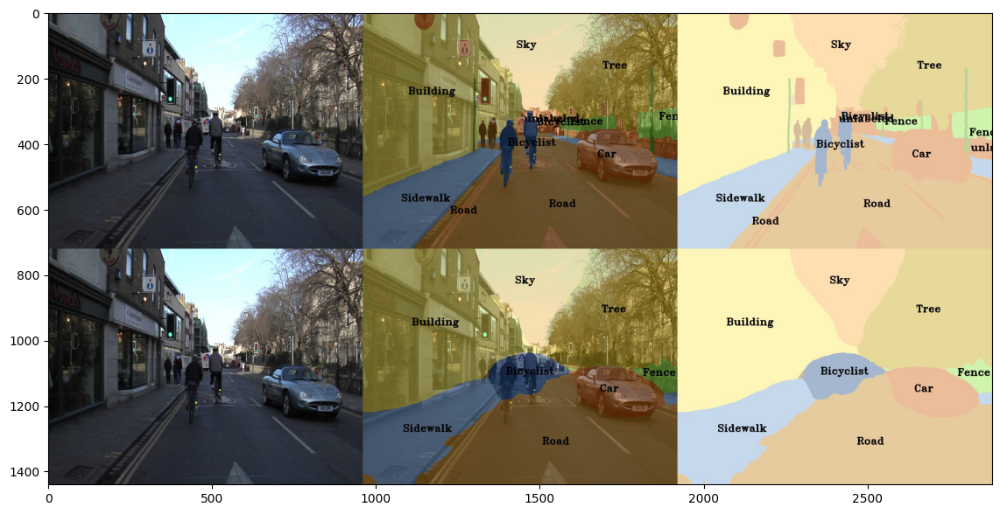

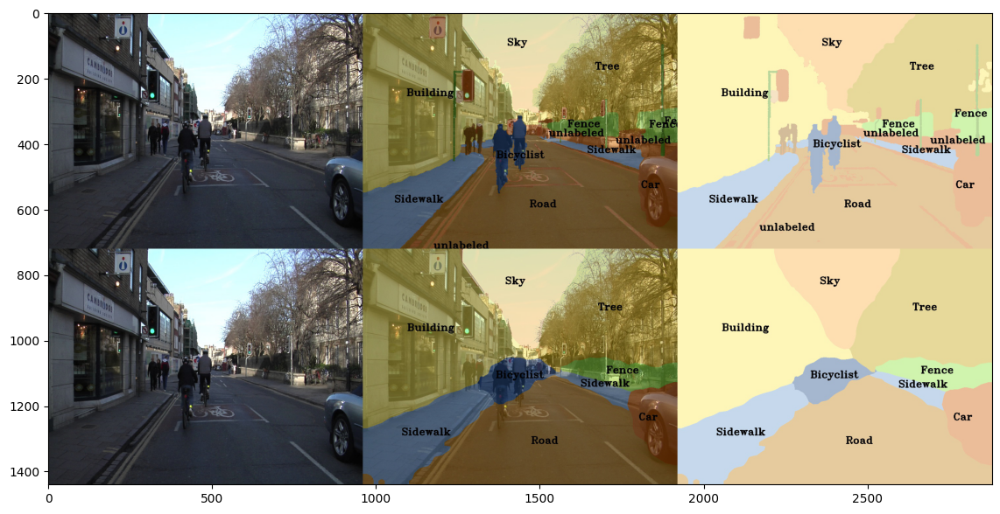

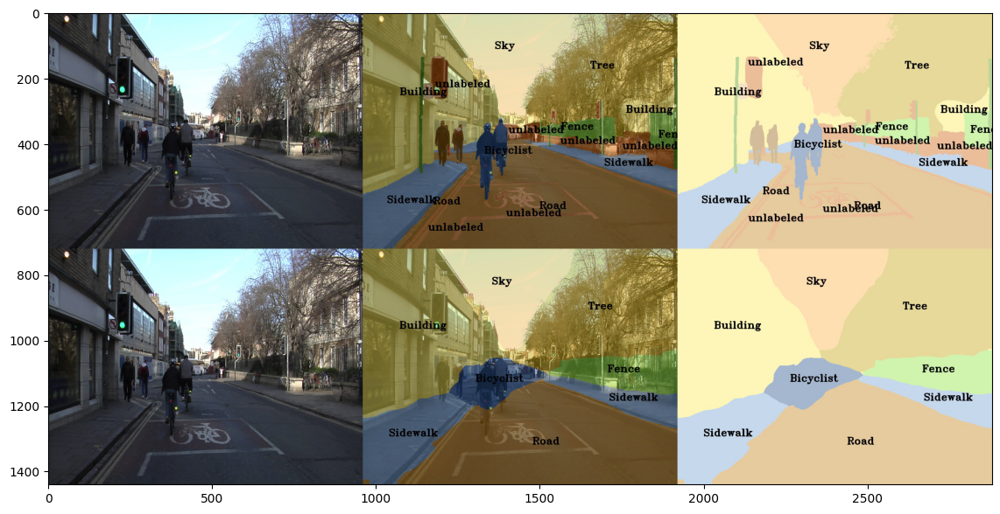

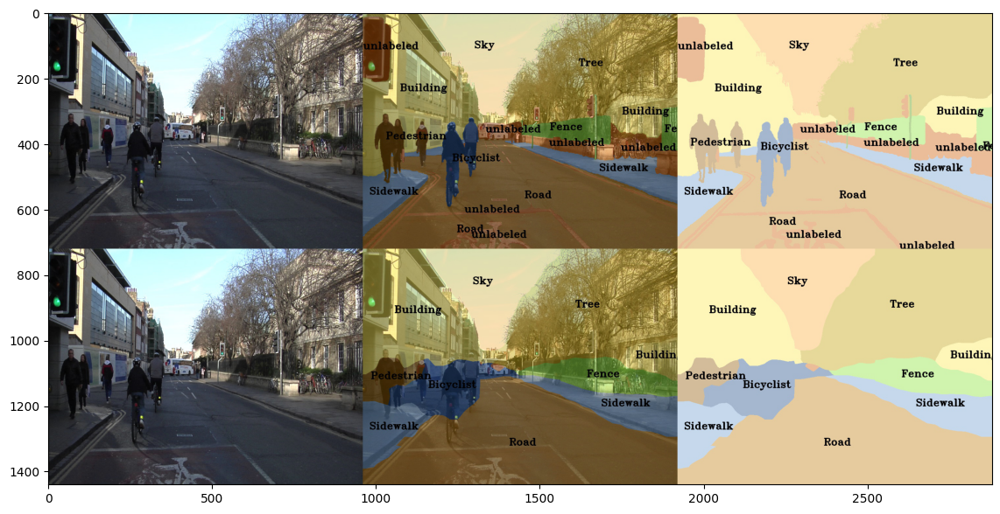

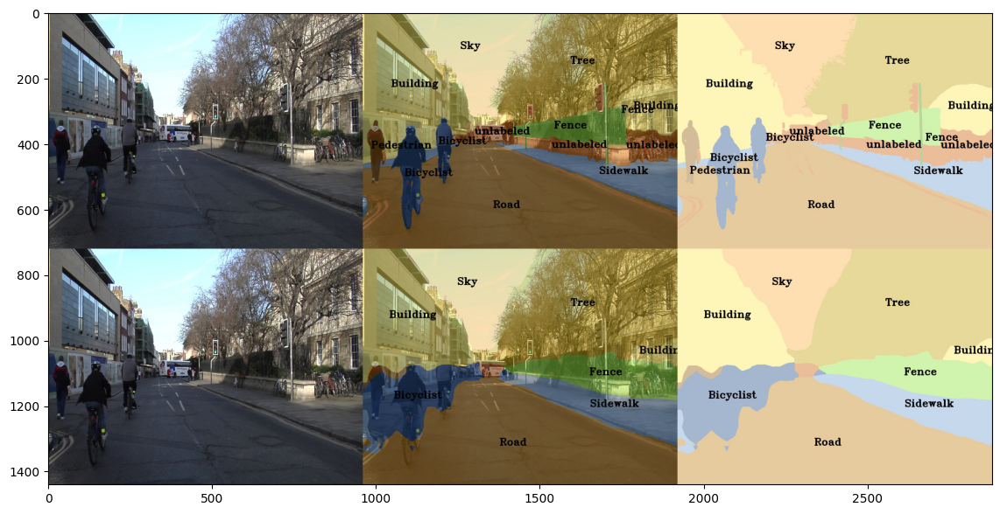

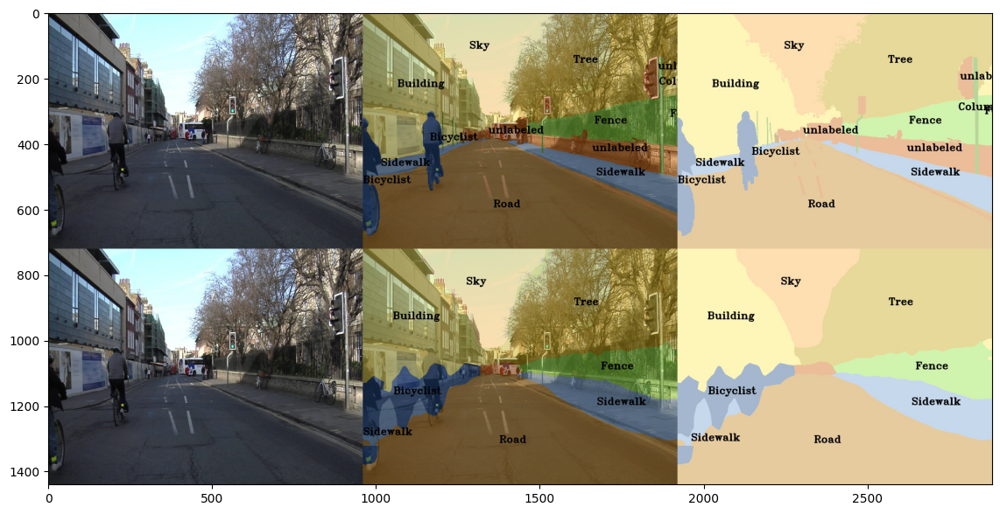

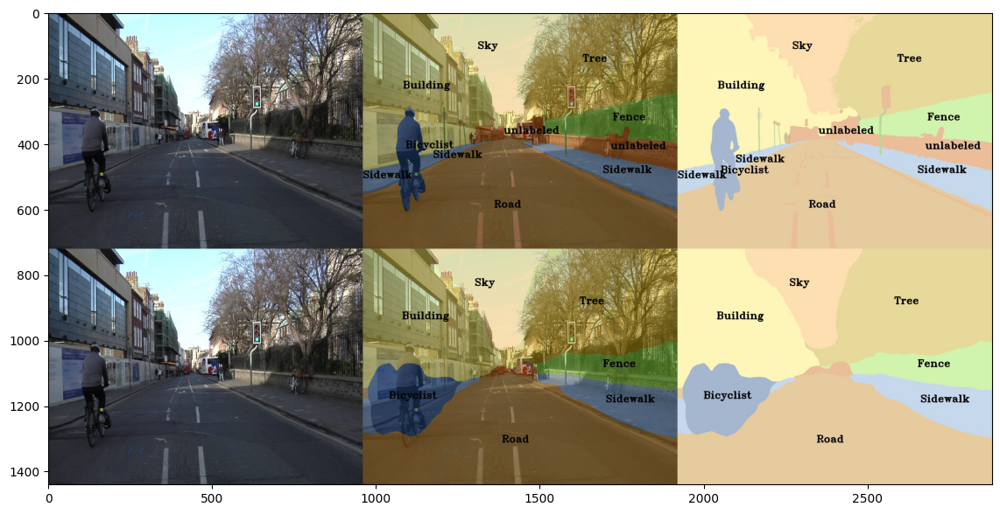

In [7]:
show_image_grid(rgb_predictions_dir, "0016E5_07997.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08017.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08037.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08057.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08077.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08097.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08117.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08137.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08157.jpg")

The following cell will automatically zip up the predictions for you if you are working locally on Mac or Linux. 

In [ ]:
grayscale_predictions_dir = f"train_epoch_{args.epochs}/camvid-11/{args.base_size}/gray"
!ls -ltrh $grayscale_predictions_dir
!zip -r grayscale_predictions.zip $grayscale_predictions_dir
!ls -ltrh grayscale_predictions.zip

In this section you will load the model trained on the Camvid-11 dataset and train it on the Kitti Road Segmentation dataset.

In [ ]:
args.model_path = f"exp/camvid/{args.arch}/model/train_epoch_{args.epochs}.pth"
args.data_root = "./kitti"
args.classes = 2
args.save_path = f"exp/kitti/{args.arch}/model/kitti_result"
args.batch_size = 32
args.batch_size_val = 1
args.dataset = "kitti"
args.evaluate = False
args.epochs = 20

import os

import torch
os.makedirs(args.save_path, exist_ok=True)
print(args)

In [ ]:
args.base_lr = 0.001
args.momentum = 0.9
args.weight_decay = 0.0001

In [ ]:
from src.vision.trainer import transfer_train
transfer_train(args, device)